In [2]:
#Copy the code and change the name for other artists
artist_name = "TravisScott"

In [3]:
import pandas as pd
import codecs
import json
from pandas.io.json import json_normalize

In [4]:
#Machine learning libraries for Text analysis
import nltk  # machine learning with text
from nltk import download as nltk_download
from nltk.corpus import stopwords, wordnet  # List of common words
from nltk.tokenize import word_tokenize  # Split text into significant forms
from nltk.stem import WordNetLemmatizer  # Reduce words to their root form
from nltk import pos_tag  # Tag words with parts of speech
from collections import defaultdict  # Dictionaries that have a backup value
from sklearn.feature_extraction.text import CountVectorizer  # Convert text to sparse matrices
from textblob import TextBlob  # Sentiment analysis
from gensim.models.ldamodel import LdaModel  # Topic extraction
from gensim.models.phrases import Phrases  # ngrams
from gensim import corpora  # Vectorization
import pyLDAvis
from wordcloud import WordCloud  # Create wordclouds
import matplotlib.pylab as plt

In [8]:
from lyricsgenius import Genius

genius = Genius('JOSfSO0Cn0Y3avlw_ItRLdmwFj3s-36fjS-POUolMGFiWkUiE_zHXfQZVsOOqbxA', timeout=10)
artist = genius.search_artist(artist_name, max_songs = 200) # use max_songs=10 parameter to limit to 10 songs

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Searching for songs by Drake...

Song 1: "God’s Plan"
Song 2: "In My Feelings"
Song 3: "Hotline Bling"
Song 4: "One Dance"
Song 5: "Hold On, We’re Going Home"
Song 6: "Know Yourself"
Song 7: "Back to Back"
Song 8: "All Me"
Song 9: "From Time"
Song 10: "Fake Love"
Song 11: "0 to 100 / The Catch Up"
Song 12: "The Motto"
Song 13: "Pound Cake / Paris Morton Music 2"
Song 14: "Started from the Bottom"
Song 15: "Marvin’s Room"
Song 16: "HYFR"
Song 17: "Nice For What"
Song 18: "Passionfruit"
Song 19: "Child’s Play"
Song 20: "Energy"
Song 21: "Too Good"
Song 22: "Furthest Thing"
Song 23: "Jungle"
Song 24: "Over My Dead Body"
Song 25: "Worst Behavior"
Song 26: "Summer Sixteen"
Song 27: "The Language"
Song 28: "Girls Love Beyoncé"
Song 29: "How Bout Now"
Song 30: "Too Much"
Song 31: "Shot for Me"
Song 32: "Nonstop"
Song 33: "Legend"
Song 34: "Portland"
Song 35: "Controlla"
Song 36: "Gyalchester"
Song 37: "U With Me?"
Song 38: "Headlines"
Song 39: "I’m Upset"
Song 40: "Own It"
Song 41: "Fire & De

In [9]:
artist_json = artist.save_lyrics()

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Lyrics_Drake.json already exists. Overwrite?
(y/n): y
Wrote Lyrics_Drake.json.


In [129]:
#artist = pd.read_json('Lyrics_artist.json', orient='index')
#artist = pd.read_json(codecs.open('Lyrics_artist.json','r','utf-8'))
#df = json.loads('Lyrics_artist.json').text
#df = pd.DataFrame.from_dict('Lyrics_artist.json', orient='index')
name_string = artist_name.replace(' ', '')
print(name_string)
lyricsFile = "Lyrics_"+str(name_string)+".json"
with open(lyricsFile) as json_data:
    data = json.load(json_data)

df = pd.DataFrame(data['songs'])
artist_df = df[['full_title', 'title', 'artist', 'lyrics', 'featured_artists', 'release_date']]

Drake


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [131]:
data

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'alternate_names': ['Aubrey Drake Graham',
  'Drizzy',
  '6 God',
  'Champagne Papi',
  'Aubrey D. Graham',
  'Aubrey Graham',
  'C. Papi'],
 'api_path': '/artists/130',
 'description': {'plain': 'Aubrey Drake Graham (born October 24, 1986) is a Canadian rapper, singer, songwriter, record producer, actor, and entrepreneur.\n\nDrake is part of a generation of rappers, along with Wiz Khalifa, Kid Cudi and others, who came up through internet mixtapes. Drizzy put out three mixtapes from 2006 to 2009: Room for Improvement, Comeback Season, and So Far Gone. These mixtapes got him the attention of Lil Wayne, and spawned the hit singles “Forever” and “Best I Ever Had,” the latter coming from his critically acclaimed mixtape So Far Gone. During this period, Drake also made a slew of guest appearances on tracks by artists from DJ Khaled to JAY-Z.\n\nAfter years without a record deal, Drake finally signed to Lil Wayne’s Young Money Entertainment label in 2009. The next year, he released his deb

In [130]:
artist_df.head(100)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,full_title,title,artist,lyrics,featured_artists,release_date
0,God's Plan by Drake,God’s Plan,Drake,[Intro]\nAnd they wishin' and wishin' and wish...,[],2018-01-19
1,In My Feelings by Drake,In My Feelings,Drake,"[Intro: Drake]\nTrap, TrapMoneyBenny\nThis shi...",[],2018-06-29
2,Hotline Bling by Drake,Hotline Bling,Drake,[Intro]\nYou used to call me on my\nYou used t...,[],2015-07-25
3,One Dance by Drake (Ft. Kyla & Wizkid),One Dance,Drake,"[Intro: Kyla]\nBaby, I like your style\n\n[Ver...","[{'api_path': '/artists/155256', 'header_image...",2016-04-05
4,"Hold On, We're Going Home by Drake (Ft. Majid ...","Hold On, We’re Going Home",Drake,[Verse 1: Drake]\nI got my eyes on you\nYou're...,"[{'api_path': '/artists/64585', 'header_image_...",2013-08-07
...,...,...,...,...,...,...
95,Draft Day by Drake,Draft Day,Drake,[Produced by The Fam; co-produced by Boi-1da]\...,[],2014-04-01
96,"Two Birds, One Stone by Drake","Two Birds, One Stone",Drake,"[Intro]\nYeah, more, yeah\n\n[Verse]\nMore tim...",[],2016-10-23
97,Used To by Drake (Ft. Lil Wayne),Used To,Drake,[Produced by WondaGurl]\n\n[Intro: Drake]\nYea...,"[{'api_path': '/artists/4', 'header_image_url'...",2015-02-13
98,Practice by Drake,Practice,Drake,"[Intro]\nYeah, Cash money shit\nCash money shi...",[],2011-11-15


In [98]:
artist_df.lyrics[0]

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'[Intro]\nAnd they wishin\' and wishin\' and wishin\' and wishin\'\nThey wishin\' on me, yeah\n\n[Verse 1]\nI been movin\' calm, don\'t start no trouble with me\nTryna keep it peaceful is a struggle for me\nDon\'t pull up at 6 AM to cuddle with me\nYou know how I like it when you lovin\' on me\nI don\'t wanna die for them to miss me\nYes, I see the things that they wishin\' on me\nHope I got some brothers that outlive me\nThey gon\' tell the story, shit was different with me\n\n[Chorus]\nGod\'s plan, God\'s plan\nI hold back, sometimes I won\'t, yuh\nI feel good, sometimes I don\'t, ayy, don\'t\nI finessed down Weston Road, ayy, \'nessed\nMight go down a G.O.D., yeah, wait\nI go hard on Southside G, yeah, wait\nI make sure that north-side eat\n\n[Post-Chorus]\nAnd still, bad things\nIt\'s a lot of bad things\nThat they wishin\' and wishin\' and wishin\' and wishin\'\nThey wishin\' on me\nBad things\nIt\'s a lot of bad things\nThat they wishin\' and wishin\' and wishin\' and wishin\'\nT

In [99]:
artist_df.lyrics[1]

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


"[Intro: Drake]\nTrap, TrapMoneyBenny\nThis shit got me in my feelings\nGotta be real with it, yeah\n\n[Chorus: Drake]\nKiki, do you love me? Are you riding?\nSay you'll never ever leave from beside me\n'Cause I want ya, and I need ya\nAnd I'm down for you always\nKB, do you love me? Are you riding?\nSay you'll never ever leave from beside me\n'Cause I want ya, and I need ya\nAnd I'm down for you always\n\n[Verse: Drake]\nLook, the new me is really still the real me\nI swear you gotta feel me before they try and kill me\nThey gotta make some choices, they runnin' out of options\n'Cause I've been goin' off and they don't know when it's stoppin'\nAnd when you get to toppin', I see that you've been learnin'\nAnd when you get to shoppin', you spend it like you earned it\nAnd when you popped off on your ex he deserved it\nI thought you were the one from the jump that confirmed it\nTrapMoneyBenny\nI buy you Champagne but you love some Henny\nFrom the block like you Jenny\nI know you special,

In [100]:
artist_df.lyrics[2]

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


"[Intro]\nYou used to call me on my\nYou used to, you used to\nYeah\n\n[Chorus]\nYou used to call me on my cell phone\nLate-night when you need my love\nCall me on my cell phone\nLate-night when you need my love\nAnd I know when that hotline bling\nThat can only mean one thing\nI know when that hotline bling\nThat can only mean one thing\n\n[Verse 1]\nEver since I left the city, you\nGot a reputation for yourself now\nEverybody knows and I feel left out\nGirl, you got me down, you got me stressed out\n'Cause ever since I left the city, you\nStarted wearing less and goin' out more\nGlasses of champagne out on the dance floor\nHangin' with some girls I've never seen before\n\n[Chorus]\nYou used to call me on my cell phone\nLate-night when you need my love\nCall me on my cell phone\nLate-night when you need my love\nI know when that hotline bling\nThat can only mean one thing\nI know when that hotline bling\nThat can only mean one thing\n\n[Verse 2]\nEver since I left the city, you, you, 

# Lyric Analysis

## Cleaning the lyrics

In [101]:
artist_df.dtypes

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


full_title    object
artist        object
lyrics        object
dtype: object

In [102]:
artist_df.lyrics = artist_df.lyrics.str.lower()

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/generic.py:5491: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [103]:
# Remove quotes
artist_df.lyrics = artist_df.lyrics.replace(to_replace="(\u2019)", value="'", regex=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [104]:
artist_df.lyrics = artist_df.lyrics.replace(to_replace="won’t", value="will not", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="can’t", value="can not", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="wanna", value="want to", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="n't", value=" not", regex=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [105]:
artist_df.lyrics = artist_df.lyrics.replace(to_replace="it's", value="it is", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="i've", value="i have", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="i'm", value="i am", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="n' ", value="ng ", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace="n' ", value="ng ", regex=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [106]:
# Remove common interjections, or singing sounds
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"[A|a]ah|[A|a]agh|[A|a]yy|[O|o]oh", value="", regex=True) 
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"[H|h]mm|[M|m]mm|[B|b]rr", value="", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"[Y|y]eah", value="", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"[L|l]ike", value="", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"[G|g]et", value="", regex=True)
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"[G|g]ot", value="", regex=True)

# remove verse, chorus, bridge, intro , outro anotations 
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"\[[^]]*\]", value="", regex=True) 

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [107]:
artist_df.lyrics[2]

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


"\nyou used to call me on my\nyou used to, you used to\n\n\n\nyou used to call me on my cell phone\nlate-night when you need my love\ncall me on my cell phone\nlate-night when you need my love\nand i know when that hotline bling\nthat can only mean one thing\ni know when that hotline bling\nthat can only mean one thing\n\n\never since i left the city, you\n a reputation for yourself now\neverybody knows and i feel left out\ngirl, you  me down, you  me stressed out\n'cause ever since i left the city, you\nstarted wearing less and going out more\nglasses of champagne out on the dance floor\nhanging with some girls i have never seen before\n\n\nyou used to call me on my cell phone\nlate-night when you need my love\ncall me on my cell phone\nlate-night when you need my love\ni know when that hotline bling\nthat can only mean one thing\ni know when that hotline bling\nthat can only mean one thing\n\n\never since i left the city, you, you, you\nyou and me, we just do not  along\nyou make me 

In [108]:
artist_df.lyrics = artist_df.lyrics.replace(to_replace=[r"\\t|\\n|\\r", "\t|\n|\r"], value=" ", regex=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [109]:
artist_df.lyrics = artist_df.lyrics.replace(to_replace=r"\W", value=" ", regex=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [110]:
# Remove common words from English lyrics 

artist_df.lyrics = artist_df.lyrics.apply(word_tokenize)
stop_words = stopwords.words("english")
artist_df.lyrics = artist_df.lyrics.apply(lambda x: [y for y in x if y not in stop_words
                                                              and len(y) > 2])

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [111]:
artist_df.lyrics[2]

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['used',
 'call',
 'used',
 'used',
 'used',
 'call',
 'cell',
 'phone',
 'late',
 'night',
 'need',
 'love',
 'call',
 'cell',
 'phone',
 'late',
 'night',
 'need',
 'love',
 'know',
 'hotline',
 'bling',
 'mean',
 'one',
 'thing',
 'know',
 'hotline',
 'bling',
 'mean',
 'one',
 'thing',
 'ever',
 'since',
 'left',
 'city',
 'reputation',
 'everybody',
 'knows',
 'feel',
 'left',
 'girl',
 'stressed',
 'cause',
 'ever',
 'since',
 'left',
 'city',
 'started',
 'wearing',
 'less',
 'going',
 'glasses',
 'champagne',
 'dance',
 'floor',
 'hanging',
 'girls',
 'never',
 'seen',
 'used',
 'call',
 'cell',
 'phone',
 'late',
 'night',
 'need',
 'love',
 'call',
 'cell',
 'phone',
 'late',
 'night',
 'need',
 'love',
 'know',
 'hotline',
 'bling',
 'mean',
 'one',
 'thing',
 'know',
 'hotline',
 'bling',
 'mean',
 'one',
 'thing',
 'ever',
 'since',
 'left',
 'city',
 'along',
 'make',
 'feel',
 'wrong',
 'going',
 'places',
 'belong',
 'ever',
 'since',
 'left',
 'city',
 'exactly',
 'ask

In [112]:
lemma = WordNetLemmatizer()

# Dictionary to convert between part-of-speech tags and the ones the lemmatizer understands

tag_dict = defaultdict(lambda : wordnet.NOUN)
tag_dict['J'] = wordnet.ADJ
tag_dict['V'] = wordnet.VERB
tag_dict['R'] = wordnet.ADV

# function to lemmatize a sentence

def get_lemma(word):
    """Gets the POS tag for a word, and then returns the lemmatized form of the word"""
    tag = pos_tag([word])[0][1][0]
    tag = tag_dict[tag]
    
    return lemma.lemmatize(word, tag)

# Perform the lemmatization
artist_df.lyrics = artist_df.lyrics.apply(lambda x: [get_lemma(word) for word in x])

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [113]:
# Create the list of words and their frequency (corpus)
from gensim import corpora
pyLDAvis.enable_notebook()
dictionary = corpora.Dictionary(artist_df.lyrics )
corpus = [dictionary.doc2bow(text) for text in artist_df.lyrics ]

import pickle
pickle.dump(corpus, open('corpus.pkl', 'wb'))
dictionary.save('dictionary.gensim')

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [114]:
import gensim
NUM_TOPICS = 5
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=15)
ldamodel.save('model3.gensim')
topics = ldamodel.print_topics(num_words=6)
for topic in topics:
    print(topic)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(0, '0.024*"know" + 0.014*"say" + 0.011*"want" + 0.011*"time" + 0.011*"nigga" + 0.010*"one"')
(1, '0.016*"know" + 0.016*"say" + 0.013*"love" + 0.012*"nigga" + 0.012*"fuck" + 0.010*"want"')
(2, '0.024*"know" + 0.019*"nigga" + 0.016*"shit" + 0.010*"fuck" + 0.010*"want" + 0.008*"one"')
(3, '0.016*"know" + 0.012*"fuck" + 0.011*"want" + 0.010*"shit" + 0.010*"nigga" + 0.010*"go"')
(4, '0.020*"know" + 0.020*"nigga" + 0.016*"woah" + 0.016*"girl" + 0.016*"make" + 0.013*"right"')


In [115]:
import pyLDAvis.gensim
lda_display = pyLDAvis.gensim.prepare(ldamodel, corpus, dictionary)
pyLDAvis.display(lda_display)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Wordcloud

In [116]:
artist_df.lyrics = artist_df.lyrics.apply(lambda x: " ".join(x))

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/generic.py:5491: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [117]:
artist_df.head()

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,full_title,artist,lyrics
0,God's Plan by Drake,Drake,wish wish wish wishin wish move calm start tro...
1,In My Feelings by Drake,Drake,trap trapmoneybenny shit feeling real kiki lov...
2,Hotline Bling by Drake,Drake,use call use use use call cell phone late nigh...
3,One Dance by Drake (Ft. Kyla & Wizkid),Drake,baby style grip waist front way back way know ...
4,"Hold On, We're Going Home by Drake (Ft. Majid ...",Drake,eye everything see want hot love emotion endle...


In [118]:
# Create an object that converts strings into a sparse matrix
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(max_features= 20000 , min_df=0.01, ngram_range= (1,1))

# Convert the text column to a sparse matrix

data_dtm = vectorizer.fit_transform(artist_df.lyrics)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [119]:
# Create a dataframe of terms and frequencies
# Get the frequency of each term

term_frequencies = data_dtm.sum(axis=0)

# Match frequencies to terms

frequent_terms = [(word, term_frequencies[0, id]) for word, id in vectorizer.vocabulary_.items()]

# Convert the word-frequency pairings to a dataframe

term_df = pd.DataFrame(columns=["term","frequency"], data=frequent_terms)

# Sort the dataframe

term_df.sort_values(by="frequency", ascending=False, inplace=True)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


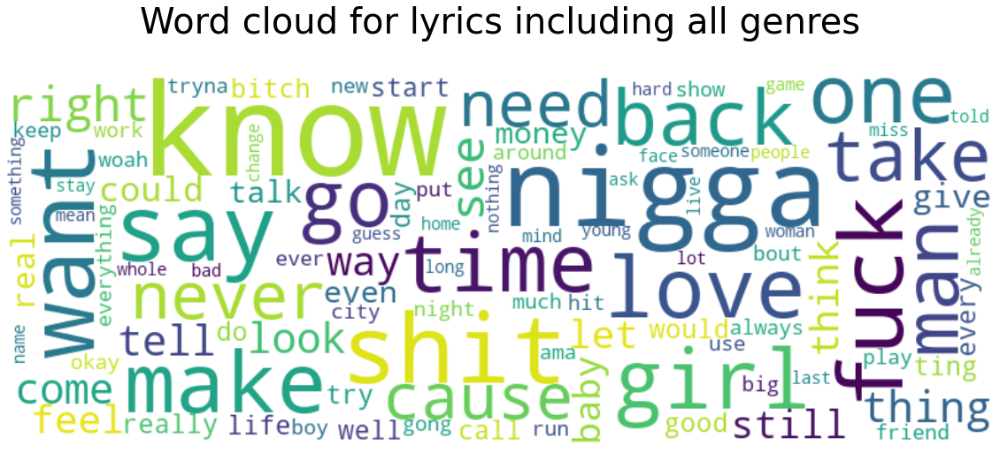

In [120]:
# Create a dictionary of most frequent terms ((required for word clouds)

term_dict = term_df.set_index('term')['frequency'].to_dict()

# Create a wordcloud of most frequent terms

wc = WordCloud(width=800, height=300, background_color="white",
               max_words=100)

wc.generate_from_frequencies(term_dict)

# Display the cloud

plt.figure(figsize=(20, 10))
plt.title("Word cloud for lyrics including all genres", fontsize = 40, pad = 50 )
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

# Sentiment

In [241]:
# Assign sentiment to each lyric
artist_df["sentiment"] = artist_df.lyrics.apply(lambda x: TextBlob(x).sentiment.polarity)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-241-d312c35c4e1f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  artist_df["sentiment"] = artist_df.lyrics.apply(lambda x: TextBlob(x).sentiment.polarity)


In [242]:
artist_df.sort_values(by="sentiment", ascending=False).head(10)

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,full_title,artist,lyrics,sentiment
4,"Hold On, We're Going Home by Drake (Ft. Majid ...",Drake,get eye everything see want hot love emotion e...,0.244355
1,In My Feelings by Drake,Drake,trap trapmoneybenny shit get feeling get real ...,0.114005
3,One Dance by Drake (Ft. Kyla & Wizkid),Drake,baby like style grip waist front way back way ...,0.051622
8,From Time by Drake (Ft. Jhené Aiko),Drake,minute since kick caught bitch get star love d...,0.041095
9,Fake Love by Drake,Drake,long look like look get fake people show fake ...,0.034019
7,All Me by Drake (Ft. 2 Chainz & Big Sean),Drake,really step game bitch get start pay get free ...,0.023915
2,Hotline Bling by Drake,Drake,use call use use yeah use call cell phone late...,-0.036971
6,Back to Back by Drake,Drake,man man man yeah learn game william wesley nev...,-0.058929
5,Know Yourself by Drake,Drake,hol yute hol hol hol hol hol sleep street shak...,-0.143802
0,God's Plan by Drake,Drake,wish wish wish wishin wish yeah move calm star...,-0.147222
